In [4]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [5]:
# Aurore la femme de ma vie
import os
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
from tqdm import tqdm
import networkx as nx
import scipy
import json
import sys
path = '/content/drive/MyDrive/EcolesIngenieur/NTNU/MachineLearning/GroupWork/'
sys.path.append(path)
import utils
import settings
import pickle
from sklearn.preprocessing import StandardScaler, Normalizer, RobustScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from datetime import datetime
from sklearn.preprocessing import PolynomialFeatures

pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 200)

path = "/content/drive/MyDrive/EcolesIngenieur/NTNU/MachineLearning/GroupWork/"

In [6]:
train_a, train_b, train_c, X_train_estimated_a, X_train_estimated_b, X_train_estimated_c, X_train_observed_a, X_train_observed_b, X_train_observed_c, X_test_estimated_a, X_test_estimated_b, X_test_estimated_c = utils.read_files(diff_path=path)
test = pd.read_csv(path+"test.csv")
sample_submission = pd.read_csv(path+"sample_submission.csv")

## Data analysis

## Overview of Datas


In this section, we'll get to grips with the data and begin to understand its structure, what it's all about, and so on...




File dimensions



In [7]:
print(train_a.shape,train_b.shape,train_c.shape)

(34085, 2) (32848, 2) (32155, 2)


The dimensions of train_a, train_b and train_c are (34085, 2) (32848, 2) (32155, 2);

In [8]:
print(X_train_estimated_a.shape,X_train_estimated_b.shape,X_train_estimated_c.shape)

(17576, 47) (17576, 47) (17576, 47)


The dimensions of X_train_estimated_a, X_train_estimated_b and X_train_estimated_c are (17576, 47) (17576, 47) (17576, 47).

In [9]:
print(X_train_observed_a.shape,X_train_observed_b.shape,X_train_observed_c.shape)

(118669, 46) (116929, 46) (116825, 46)


The dimensions of X_train_observed_a, X_train_observed_b and X_train_observed_c are (118669, 46) (116929, 46) (116825, 46).

In [10]:
print(X_train_estimated_a.shape,X_train_estimated_b.shape,X_train_estimated_c.shape)

(17576, 47) (17576, 47) (17576, 47)


The dimensions of X_train_estimated_a, X_train_estimated_b and X_train_estimated_b are (17576, 47) (17576, 47) (17576, 47).

We observe that X_train_estimated and X_test_estimated has one more column than X_test_observed which is date_calc

**We also note that observed dataframes contain 10 times more rows than estimated ones.**

Look at the variable types

In [11]:
X_train_estimated_a.dtypes

date_calc                         datetime64[ns]
date_forecast                     datetime64[ns]
absolute_humidity_2m:gm3                 float32
air_density_2m:kgm3                      float32
ceiling_height_agl:m                     float32
clear_sky_energy_1h:J                    float32
clear_sky_rad:W                          float32
cloud_base_agl:m                         float32
dew_or_rime:idx                          float32
dew_point_2m:K                           float32
diffuse_rad:W                            float32
diffuse_rad_1h:J                         float32
direct_rad:W                             float32
direct_rad_1h:J                          float32
effective_cloud_cover:p                  float32
elevation:m                              float32
fresh_snow_12h:cm                        float32
fresh_snow_1h:cm                         float32
fresh_snow_24h:cm                        float32
fresh_snow_3h:cm                         float32
fresh_snow_6h:cm    

In [12]:
X_test_estimated_a.dtypes

date_calc                         datetime64[ns]
date_forecast                     datetime64[ns]
absolute_humidity_2m:gm3                 float32
air_density_2m:kgm3                      float32
ceiling_height_agl:m                     float32
clear_sky_energy_1h:J                    float32
clear_sky_rad:W                          float32
cloud_base_agl:m                         float32
dew_or_rime:idx                          float32
dew_point_2m:K                           float32
diffuse_rad:W                            float32
diffuse_rad_1h:J                         float32
direct_rad:W                             float32
direct_rad_1h:J                          float32
effective_cloud_cover:p                  float32
elevation:m                              float32
fresh_snow_12h:cm                        float32
fresh_snow_1h:cm                         float32
fresh_snow_24h:cm                        float32
fresh_snow_3h:cm                         float32
fresh_snow_6h:cm    

In [13]:
X_train_observed_a.dtypes

date_forecast                     datetime64[ns]
absolute_humidity_2m:gm3                 float32
air_density_2m:kgm3                      float32
ceiling_height_agl:m                     float32
clear_sky_energy_1h:J                    float32
clear_sky_rad:W                          float32
cloud_base_agl:m                         float32
dew_or_rime:idx                          float32
dew_point_2m:K                           float32
diffuse_rad:W                            float32
diffuse_rad_1h:J                         float32
direct_rad:W                             float32
direct_rad_1h:J                          float32
effective_cloud_cover:p                  float32
elevation:m                              float32
fresh_snow_12h:cm                        float32
fresh_snow_1h:cm                         float32
fresh_snow_24h:cm                        float32
fresh_snow_3h:cm                         float32
fresh_snow_6h:cm                         float32
is_day:idx          

**We therefore only have float variables, apart from two of type datetime64[ns].**

We look at the start and end dates of the files

In [48]:
print("Observed:")
print(X_train_observed_a['date_forecast'].min(), X_train_observed_a['date_forecast'].max())
print(X_train_observed_b['date_forecast'].min(), X_train_observed_b['date_forecast'].max())
print(X_train_observed_c['date_forecast'].min(), X_train_observed_c['date_forecast'].max())

print("\n")

print("Estimated: ")
print(X_train_estimated_a['date_forecast'].min(), X_train_estimated_a['date_forecast'].max())
print(X_train_estimated_b['date_forecast'].min(), X_train_estimated_b['date_forecast'].max())
print(X_train_estimated_c['date_forecast'].min(), X_train_estimated_c['date_forecast'].max())

Observed:
2019-06-02 22:00:00 2022-10-21 01:00:00
2019-01-01 00:00:00 2022-05-03 00:00:00
2019-01-01 00:00:00 2022-05-01 22:00:00


Estimated: 
2022-10-28 22:00:00 2023-04-30 23:45:00
2022-10-28 22:00:00 2023-04-30 23:45:00
2022-10-28 22:00:00 2023-04-30 23:45:00


## Nan Study

Here, we'll see how our missing data is distributed, so that we can deal with this problem later.

Gives the proportion of missing values for each column in the DataFrame, sorted from highest to lowest, as a percentage of the total number of rows in the DataFrame.

In [15]:
X_train_estimated_a.isna().sum().sort_values(ascending=False)/(len(X_train_estimated_a))

snow_density:kgm3                 0.897189
ceiling_height_agl:m              0.222975
cloud_base_agl:m                  0.119140
date_calc                         0.000000
snow_water:kgm2                   0.000000
pressure_50m:hPa                  0.000000
prob_rime:p                       0.000000
rain_water:kgm2                   0.000000
relative_humidity_1000hPa:p       0.000000
sfc_pressure:hPa                  0.000000
snow_depth:cm                     0.000000
snow_drift:idx                    0.000000
snow_melt_10min:mm                0.000000
sun_azimuth:d                     0.000000
precip_type_5min:idx              0.000000
sun_elevation:d                   0.000000
super_cooled_liquid_water:kgm2    0.000000
t_1000hPa:K                       0.000000
total_cloud_cover:p               0.000000
visibility:m                      0.000000
wind_speed_10m:ms                 0.000000
wind_speed_u_10m:ms               0.000000
wind_speed_v_10m:ms               0.000000
pressure_10

In [16]:
X_test_estimated_a.isna().sum().sort_values(ascending=False)/(len(X_test_estimated_a))

snow_density:kgm3                 1.000000
ceiling_height_agl:m              0.275347
cloud_base_agl:m                  0.103472
date_calc                         0.000000
snow_water:kgm2                   0.000000
pressure_50m:hPa                  0.000000
prob_rime:p                       0.000000
rain_water:kgm2                   0.000000
relative_humidity_1000hPa:p       0.000000
sfc_pressure:hPa                  0.000000
snow_depth:cm                     0.000000
snow_drift:idx                    0.000000
snow_melt_10min:mm                0.000000
sun_azimuth:d                     0.000000
precip_type_5min:idx              0.000000
sun_elevation:d                   0.000000
super_cooled_liquid_water:kgm2    0.000000
t_1000hPa:K                       0.000000
total_cloud_cover:p               0.000000
visibility:m                      0.000000
wind_speed_10m:ms                 0.000000
wind_speed_u_10m:ms               0.000000
wind_speed_v_10m:ms               0.000000
pressure_10

In [17]:
X_train_observed_a.isna().sum().sort_values(ascending=False)/(len(X_train_observed_a))

snow_density:kgm3                 0.977045
ceiling_height_agl:m              0.187471
cloud_base_agl:m                  0.067971
date_forecast                     0.000000
snow_water:kgm2                   0.000000
pressure_50m:hPa                  0.000000
prob_rime:p                       0.000000
rain_water:kgm2                   0.000000
relative_humidity_1000hPa:p       0.000000
sfc_pressure:hPa                  0.000000
snow_depth:cm                     0.000000
snow_drift:idx                    0.000000
snow_melt_10min:mm                0.000000
sun_azimuth:d                     0.000000
precip_type_5min:idx              0.000000
sun_elevation:d                   0.000000
super_cooled_liquid_water:kgm2    0.000000
t_1000hPa:K                       0.000000
total_cloud_cover:p               0.000000
visibility:m                      0.000000
wind_speed_10m:ms                 0.000000
wind_speed_u_10m:ms               0.000000
wind_speed_v_10m:ms               0.000000
pressure_10

In [18]:
X_train_estimated_b.isna().sum().sort_values(ascending=False)/(len(X_train_estimated_b))

snow_density:kgm3                 0.894003
ceiling_height_agl:m              0.209888
cloud_base_agl:m                  0.111686
date_calc                         0.000000
snow_water:kgm2                   0.000000
pressure_50m:hPa                  0.000000
prob_rime:p                       0.000000
rain_water:kgm2                   0.000000
relative_humidity_1000hPa:p       0.000000
sfc_pressure:hPa                  0.000000
snow_depth:cm                     0.000000
snow_drift:idx                    0.000000
snow_melt_10min:mm                0.000000
sun_azimuth:d                     0.000000
precip_type_5min:idx              0.000000
sun_elevation:d                   0.000000
super_cooled_liquid_water:kgm2    0.000000
t_1000hPa:K                       0.000000
total_cloud_cover:p               0.000000
visibility:m                      0.000000
wind_speed_10m:ms                 0.000000
wind_speed_u_10m:ms               0.000000
wind_speed_v_10m:ms               0.000000
pressure_10

In [19]:
X_test_estimated_b.isna().sum().sort_values(ascending=False)/(len(X_test_estimated_b))

snow_density:kgm3                 1.000000
ceiling_height_agl:m              0.262153
cloud_base_agl:m                  0.096181
date_calc                         0.000000
snow_water:kgm2                   0.000000
pressure_50m:hPa                  0.000000
prob_rime:p                       0.000000
rain_water:kgm2                   0.000000
relative_humidity_1000hPa:p       0.000000
sfc_pressure:hPa                  0.000000
snow_depth:cm                     0.000000
snow_drift:idx                    0.000000
snow_melt_10min:mm                0.000000
sun_azimuth:d                     0.000000
precip_type_5min:idx              0.000000
sun_elevation:d                   0.000000
super_cooled_liquid_water:kgm2    0.000000
t_1000hPa:K                       0.000000
total_cloud_cover:p               0.000000
visibility:m                      0.000000
wind_speed_10m:ms                 0.000000
wind_speed_u_10m:ms               0.000000
wind_speed_v_10m:ms               0.000000
pressure_10

In [20]:
X_train_observed_b.isna().sum().sort_values(ascending=False)/(len(X_train_observed_b))

snow_density:kgm3                 0.951013
ceiling_height_agl:m              0.160542
cloud_base_agl:m                  0.063911
date_forecast                     0.000000
snow_water:kgm2                   0.000000
pressure_50m:hPa                  0.000000
prob_rime:p                       0.000000
rain_water:kgm2                   0.000000
relative_humidity_1000hPa:p       0.000000
sfc_pressure:hPa                  0.000000
snow_depth:cm                     0.000000
snow_drift:idx                    0.000000
snow_melt_10min:mm                0.000000
sun_azimuth:d                     0.000000
precip_type_5min:idx              0.000000
sun_elevation:d                   0.000000
super_cooled_liquid_water:kgm2    0.000000
t_1000hPa:K                       0.000000
total_cloud_cover:p               0.000000
visibility:m                      0.000000
wind_speed_10m:ms                 0.000000
wind_speed_u_10m:ms               0.000000
wind_speed_v_10m:ms               0.000000
pressure_10

In [21]:
X_train_estimated_c.isna().sum().sort_values(ascending=False)/(len(X_train_estimated_c))

snow_density:kgm3                 0.790737
ceiling_height_agl:m              0.261493
cloud_base_agl:m                  0.159536
date_calc                         0.000000
snow_water:kgm2                   0.000000
pressure_50m:hPa                  0.000000
prob_rime:p                       0.000000
rain_water:kgm2                   0.000000
relative_humidity_1000hPa:p       0.000000
sfc_pressure:hPa                  0.000000
snow_depth:cm                     0.000000
snow_drift:idx                    0.000000
snow_melt_10min:mm                0.000000
sun_azimuth:d                     0.000000
precip_type_5min:idx              0.000000
sun_elevation:d                   0.000000
super_cooled_liquid_water:kgm2    0.000000
t_1000hPa:K                       0.000000
total_cloud_cover:p               0.000000
visibility:m                      0.000000
wind_speed_10m:ms                 0.000000
wind_speed_u_10m:ms               0.000000
wind_speed_v_10m:ms               0.000000
pressure_10

In [22]:
X_test_estimated_c.isna().sum().sort_values(ascending=False)/(len(X_test_estimated_c))

snow_density:kgm3                 1.000000
ceiling_height_agl:m              0.294792
cloud_base_agl:m                  0.130208
date_calc                         0.000000
snow_water:kgm2                   0.000000
pressure_50m:hPa                  0.000000
prob_rime:p                       0.000000
rain_water:kgm2                   0.000000
relative_humidity_1000hPa:p       0.000000
sfc_pressure:hPa                  0.000000
snow_depth:cm                     0.000000
snow_drift:idx                    0.000000
snow_melt_10min:mm                0.000000
sun_azimuth:d                     0.000000
precip_type_5min:idx              0.000000
sun_elevation:d                   0.000000
super_cooled_liquid_water:kgm2    0.000000
t_1000hPa:K                       0.000000
total_cloud_cover:p               0.000000
visibility:m                      0.000000
wind_speed_10m:ms                 0.000000
wind_speed_u_10m:ms               0.000000
wind_speed_v_10m:ms               0.000000
pressure_10

In [23]:
X_train_observed_c.isna().sum().sort_values(ascending=False)/(len(X_train_observed_c))

snow_density:kgm3                 0.920976
ceiling_height_agl:m              0.170537
cloud_base_agl:m                  0.072861
date_forecast                     0.000000
snow_water:kgm2                   0.000000
pressure_50m:hPa                  0.000000
prob_rime:p                       0.000000
rain_water:kgm2                   0.000000
relative_humidity_1000hPa:p       0.000000
sfc_pressure:hPa                  0.000000
snow_depth:cm                     0.000000
snow_drift:idx                    0.000000
snow_melt_10min:mm                0.000000
sun_azimuth:d                     0.000000
precip_type_5min:idx              0.000000
sun_elevation:d                   0.000000
super_cooled_liquid_water:kgm2    0.000000
t_1000hPa:K                       0.000000
total_cloud_cover:p               0.000000
visibility:m                      0.000000
wind_speed_10m:ms                 0.000000
wind_speed_u_10m:ms               0.000000
wind_speed_v_10m:ms               0.000000
pressure_10

We notice that the columns with NAN values are `snow_density`, `ceiling_height_agl` and `cloud_base_agl`.

**`snow_density` is empty at 90% while the others are empty at 5 to 20%.**

## Study of the target

We study the target to see how it evolves over time. If there is information to be deduced that our model will need to understand and use to make its predictions

Show variables for 3 locations




<Axes: title={'center': 'pv_measurement on location C'}, xlabel='time'>

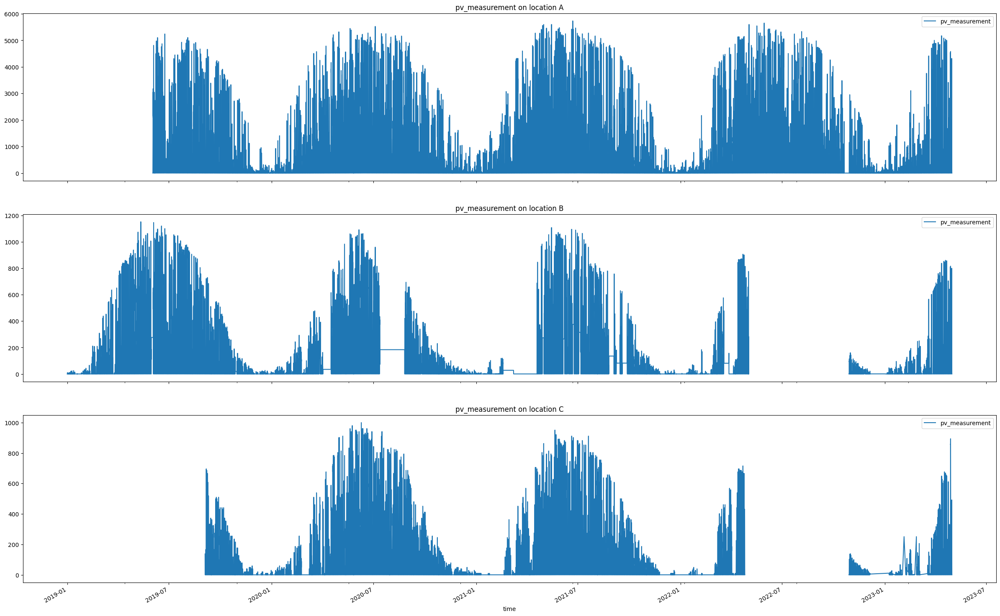

In [24]:
#show the variable pv_measurement as a functio of time
fig, axs = plt.subplots(3, 1, figsize=(30, 20), sharex=True)

train_a[['time','pv_measurement']].set_index('time').plot(ax=axs[0], title='pv_measurement on location A')
train_b[['time','pv_measurement']].set_index('time').plot(ax=axs[1], title='pv_measurement on location B')
train_c[['time','pv_measurement']].set_index('time').plot(ax=axs[2], title='pv_measurement on location C')

Our data show periodicities. In section 2.1.Signal analysis we have noticed 3 main frequencies: the year, the day and 12h.

**Our variable also has gaps or constant parts in certain areas that need to be explored in detail.**

**However, our variable varies a lot according to the weather, hence the need for a Machine Learning model.**



In [51]:
train_a = train_a.rename(columns={'time': 'date_forecast'})
train_b = train_b.rename(columns={'time': 'date_forecast'})
train_c = train_c.rename(columns={'time': 'date_forecast'})

merged_df_a = pd.merge(X_train_observed_a, train_a, on='date_forecast', how='inner')
merged_df_b = pd.merge(X_train_observed_b, train_b, on='date_forecast', how='inner')
merged_df_c = pd.merge(X_train_observed_c, train_c, on='date_forecast', how='inner')

# Add prefixes to column names during concatenation
merged_df_a.columns = 'a_' + merged_df_a.columns
merged_df_b.columns = 'b_' + merged_df_b.columns
merged_df_c.columns = 'c_' + merged_df_c.columns

merged_df_a = merged_df_a.rename(columns={'a_date_forecast': 'date_forecast'})
merged_df_b = merged_df_b.rename(columns={'b_date_forecast': 'date_forecast'})
merged_df_c = merged_df_c.rename(columns={'c_date_forecast': 'date_forecast'})

# Concatenate the DataFrames
aux =  pd.merge(merged_df_a, merged_df_b, on='date_forecast', how='inner')
total = pd.merge(aux, merged_df_c, on='date_forecast', how='inner')

print('correlation between A and B of pv_measurement:',total['a_pv_measurement'].corr(total['b_pv_measurement']))
print('corrélation between A and C of pv_measurement:',total['a_pv_measurement'].corr(total['c_pv_measurement']))
print('corrélation between B and C of pv_measurement:',total['b_pv_measurement'].corr(total['c_pv_measurement']))


correlation between A and B of pv_measurement: 0.8483123083095052
corrélation between A and C of pv_measurement: 0.9257933955622664
corrélation between B and C of pv_measurement: 0.8771619108144576


## Comparaison entre variable

In [25]:
scaler_a = MinMaxScaler()
scaler_b = MinMaxScaler()
scaler_c = MinMaxScaler()

In [26]:
X_a_to_analyse = X_train_observed_a.drop(columns='date_forecast', inplace=False)
X_b_to_analyse = X_train_observed_b.drop(columns='date_forecast', inplace=False)
X_c_to_analyse = X_train_observed_c.drop(columns='date_forecast', inplace=False)


In [27]:
columns_match_already_done = []

In [28]:
X_a_normed = scaler_a.fit_transform(X_a_to_analyse)
X_b_normed = scaler_b.fit_transform(X_b_to_analyse)
X_c_normed = scaler_c.fit_transform(X_c_to_analyse)

In [29]:
columns = list(X_a_to_analyse.columns.values)

In [30]:
columns_to_plot = [("dew_point_2m:K","absolute_humidity_2m:gm3"),
                   ("elevation:m","absolute_humidity_2m:gm3"),
                   ("elevation:m","msl_pressure:hPa"),
                   ("elevation:m","relative_humidity_1000hPa:p"),
                   ("elevation:m","snow_density:kgm3"),
                   ("elevation:m","snow_water:kgm2"),
                   ("elevation:m","sun_azimuth:d"),
                   ("elevation:m","super_cooled_liquid_water:kgm2"),
                   ("elevation:m" ,"t_1000hPa:K"),
                   ("msl_pressure:hPa","pressure_100m:hPa"),
                   ("msl_pressure:hPa","sfc_pressure:hPa"),
                   ("pressure_100m:hPa","sfc_pressure:hPa"),
                   ("pressure_50m:hPa","relative_humidity_1000hPa:p"),
                   ("sun_azimuth:d","total_cloud_cover:p")
                  ]

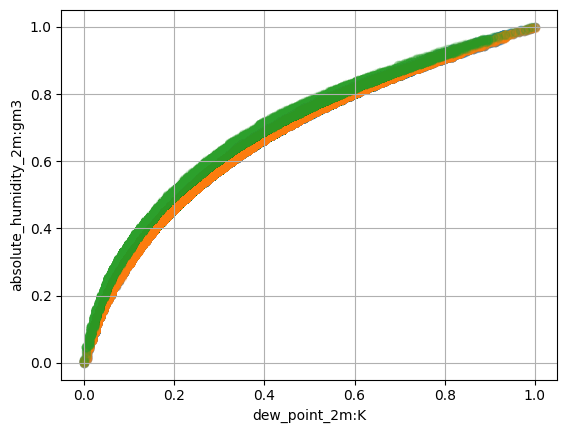

Compare dew_point_2m:K absolute_humidity_2m:gm3


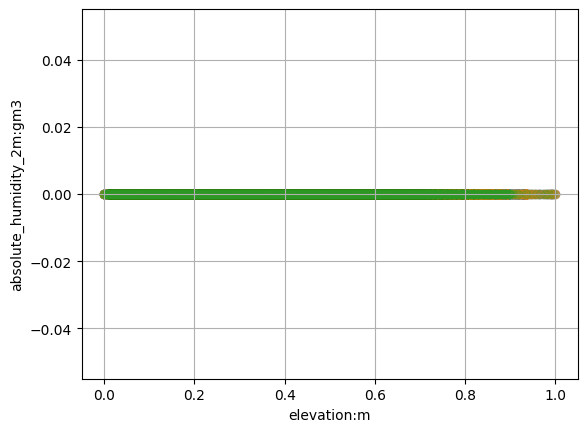

Compare elevation:m absolute_humidity_2m:gm3


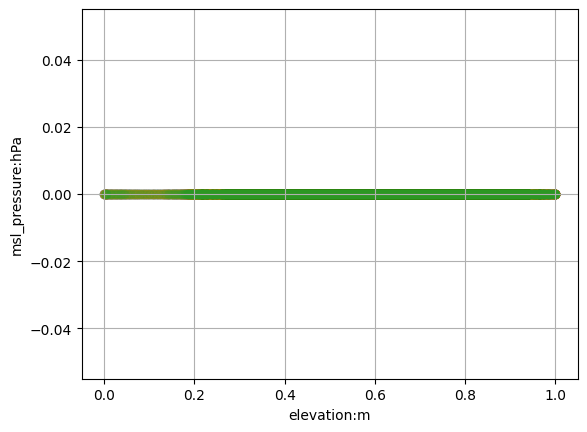

Compare elevation:m msl_pressure:hPa


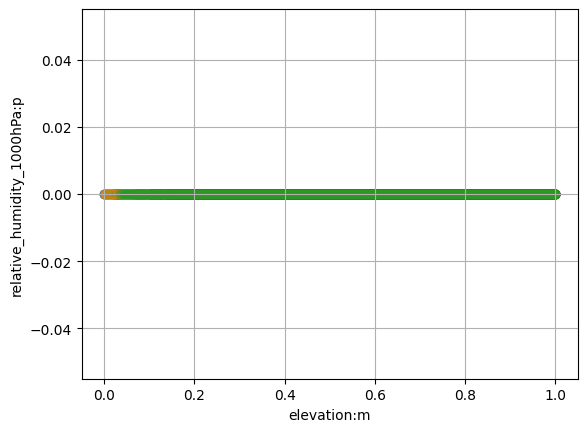

Compare elevation:m relative_humidity_1000hPa:p


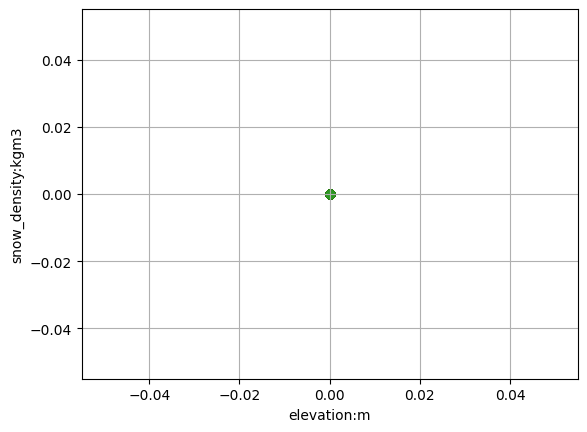

Compare elevation:m snow_density:kgm3


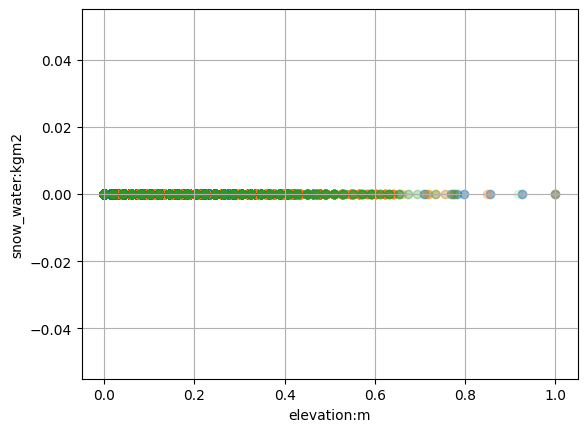

Compare elevation:m snow_water:kgm2


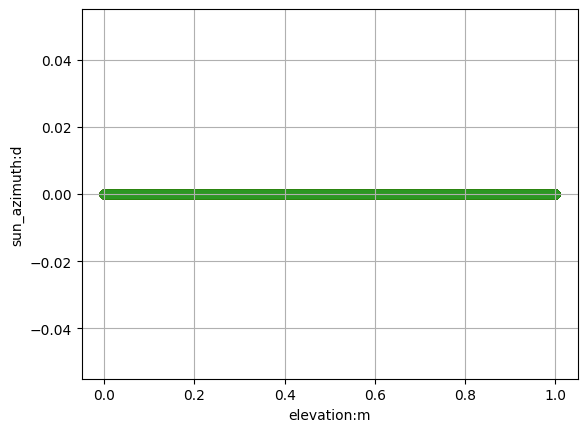

Compare elevation:m sun_azimuth:d


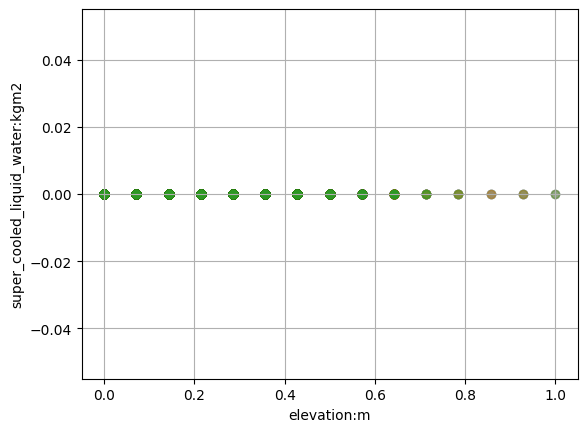

Compare elevation:m super_cooled_liquid_water:kgm2


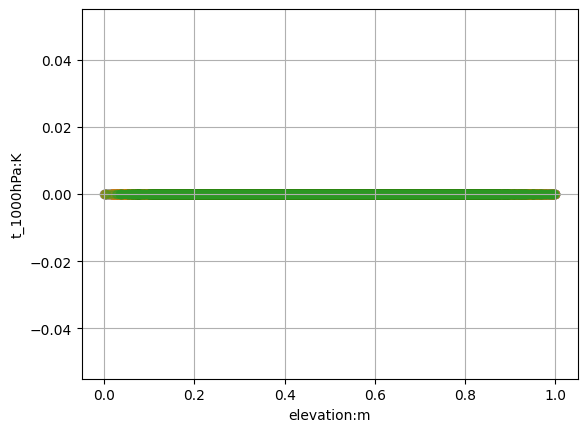

Compare elevation:m t_1000hPa:K


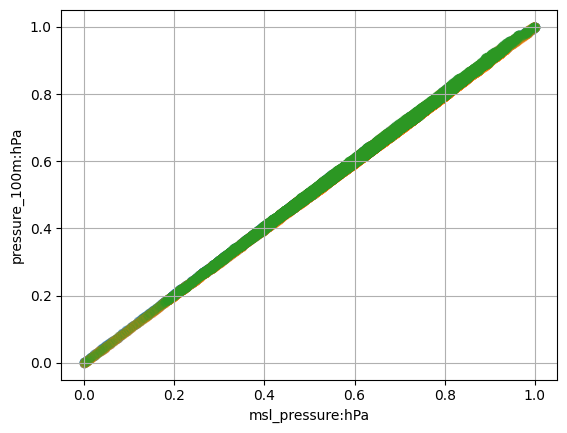

Compare msl_pressure:hPa pressure_100m:hPa


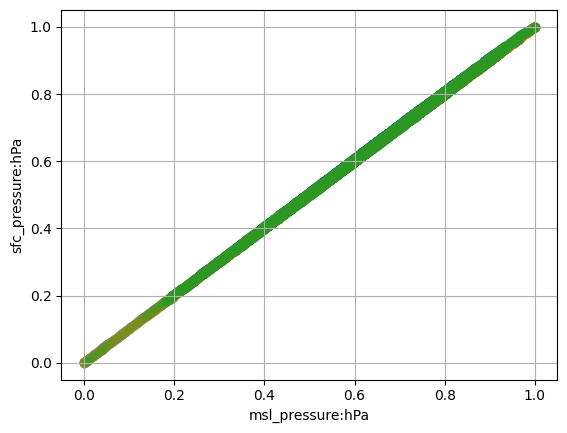

Compare msl_pressure:hPa sfc_pressure:hPa


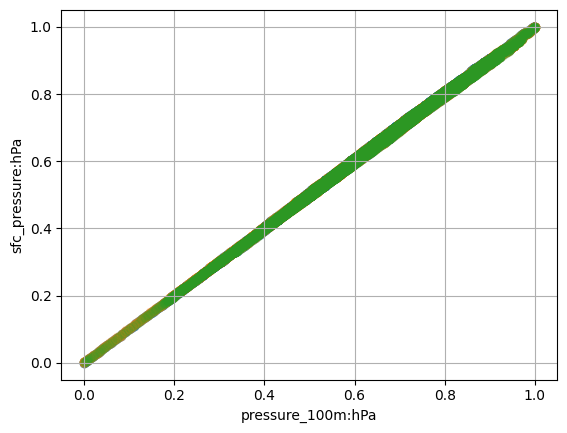

Compare pressure_100m:hPa sfc_pressure:hPa


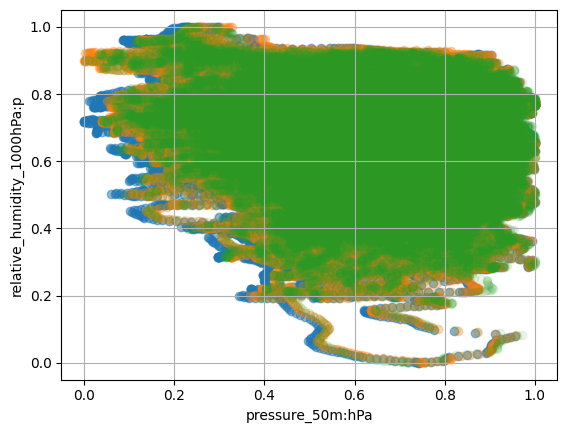

Compare pressure_50m:hPa relative_humidity_1000hPa:p


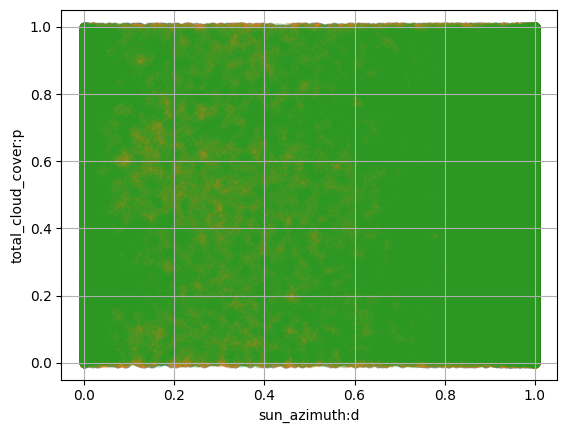

Compare sun_azimuth:d total_cloud_cover:p


In [31]:
for pair in columns_to_plot:
    c1, c2 = pair
    c1_index = columns.index(c1)
    c2_index = columns.index(c2)
    plt.scatter(X_a_normed[:, c2_index], X_a_normed[:, c1_index], alpha=0.5)
    plt.scatter(X_b_normed[:, c2_index], X_b_normed[:, c1_index], alpha=0.3)
    plt.scatter(X_c_normed[:, c2_index], X_c_normed[:, c1_index], alpha=0.1)
    plt.xlabel(c1)
    plt.ylabel(c2)
    plt.grid()
    plt.show()
    print("Compare", c1, c2)
    columns_match_already_done.append((c1, c2))
    columns_match_already_done.append((c2, c1))

## Correlation study

With the help of the correlation matrices, we can begin to study the relationships between the different variables in order to potentially distinguish groups, or other features of our dataset.

An example of a correlation matrix


In [32]:
keys = [1, 2, 3]

In [33]:
frames_train_estimated = [X_train_estimated_a.drop(columns=["date_calc"]), X_train_observed_a, X_test_estimated_a.drop(columns=["date_calc"])]
X_frames_a = pd.concat(frames_train_estimated, keys=keys)
X_frames_a.reset_index(level=0, inplace=True, names='frame_type')

train_a = train_a.rename(columns={'time': 'date_forecast'})
X_y_a = X_frames_a.merge(train_a, on='date_forecast', how='inner')
X_y_a.reset_index(drop=True, inplace=True)

/content/drive/MyDrive/EcolesIngenieur/NTNU/MachineLearning/GroupWork/utils.py:93: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data_frames.corr(method='pearson'), annot=annot, cmap=plt.cm.Reds)


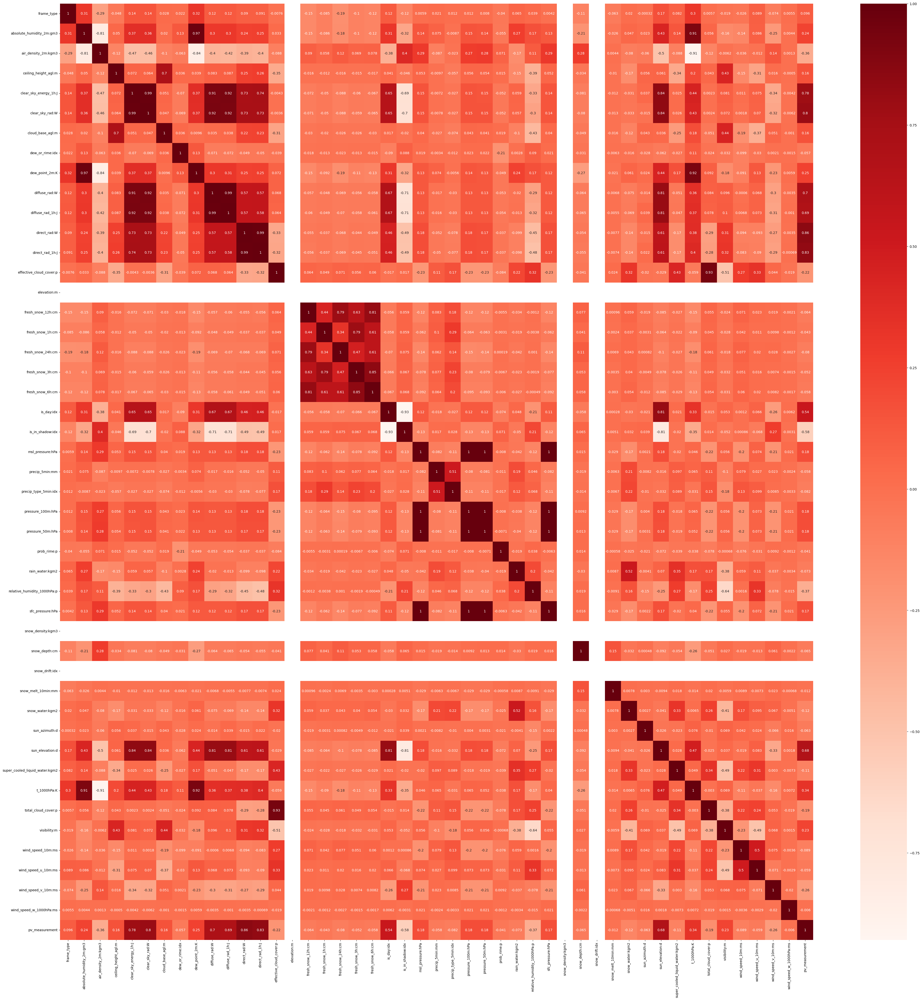

In [34]:
utils.build_corr_matrix(X_y_a, figsize=(50,50))

The most correlated variables for pv_measurement are :

*   clear_sky_energy_1h:J: clear sky energy of previous time period, available up to 24h [J/m2]
*   clear_sky_rad:W: clear sky radiation flux [W/m2]
*   diffuse_rad:W: diffuse radiation flux [W/m2]
*   diffuse_rad_1h:J:
*   direct_rad:W: direct radiation flux [W/m2]

In [35]:
frames_train_estimated = [X_train_estimated_b.drop(columns=["date_calc"]), X_train_observed_b, X_test_estimated_b.drop(columns=["date_calc"])]
X_frames_b = pd.concat(frames_train_estimated, keys=keys)
X_frames_b.reset_index(level=0, inplace=True, names='frame_type')

train_b = train_b.rename(columns={'time': 'date_forecast'})
X_y_b = X_frames_b.merge(train_b.dropna(), on='date_forecast', how='inner')
X_y_b.reset_index(drop=True, inplace=True)

frames_train_estimated = [X_train_estimated_c.drop(columns=["date_calc"]), X_train_observed_c, X_test_estimated_c.drop(columns=["date_calc"])]
X_frames_c = pd.concat(frames_train_estimated, keys=keys)
X_frames_c.reset_index(level=0, inplace=True, names='frame_type')

train_c = train_c.rename(columns={'time': 'date_forecast'})
X_y_c = X_frames_c.merge(train_c.dropna(), on='date_forecast', how='inner')
X_y_c.reset_index(drop=True, inplace=True)

frames_location= [X_y_a, X_y_b, X_y_c]
X_y = pd.concat(frames_location, keys=keys)
X_y.reset_index(level=0, inplace=True, names='location')

/content/drive/MyDrive/EcolesIngenieur/NTNU/MachineLearning/GroupWork/utils.py:93: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data_frames.corr(method='pearson'), annot=annot, cmap=plt.cm.Reds)


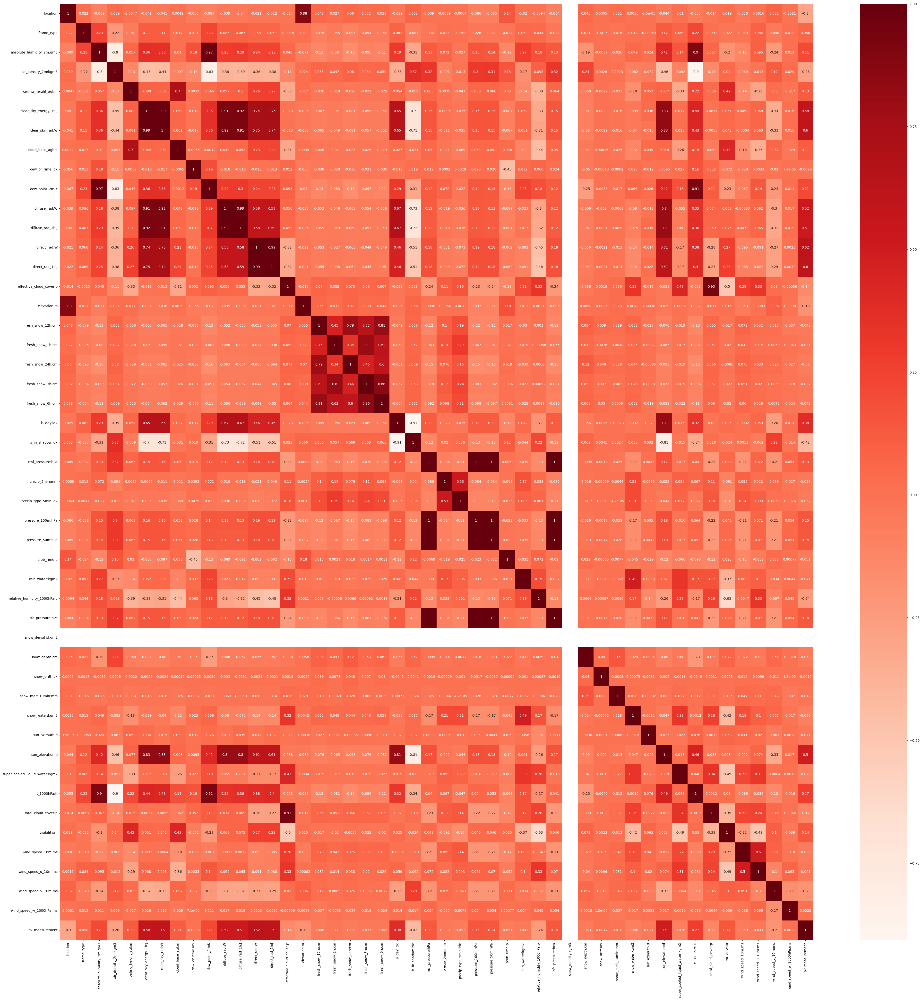

In [36]:
utils.build_corr_matrix(X_y, figsize=(50,50))

* Mettre les résultats (groupement de var par exemple)


In [37]:
frames_train_estimated = [X_train_estimated_a, X_train_estimated_b, X_train_estimated_c]
X_train_estimated = pd.concat(frames_train_estimated, keys=keys)
X_train_estimated.reset_index(level=0, inplace=True, names='location')

frames_train_observed = [X_train_observed_a, X_train_observed_b, X_train_observed_c]
X_train_observed = pd.concat(frames_train_observed, keys=keys)
X_train_observed.reset_index(level=0, inplace=True, names='location')

frames_test_estimated = [X_test_estimated_a, X_test_estimated_b, X_test_estimated_c]
X_test_estimated = pd.concat(frames_test_estimated, keys=keys)
X_test_estimated.reset_index(level=0, inplace=True, names='location')

In [38]:
X_train_estimated_merged = pd.concat(frames_train_estimated, axis=1)
X_train_estimated_merged.reset_index(drop=True, inplace=True)

X_train_observed_merged = pd.concat(frames_train_observed, axis=1)
X_train_observed_merged.reset_index(drop=True, inplace=True)

X_test_estimated_merged = pd.concat(frames_test_estimated, axis=1)
X_test_estimated_merged.reset_index(drop=True, inplace=True)

In [39]:
X_train_estimated_merged = pd.concat(frames_train_estimated, axis=1)
X_train_estimated_merged.reset_index(drop=True, inplace=True)

X_train_observed_merged = pd.concat(frames_train_observed, axis=1)
X_train_observed_merged.reset_index(drop=True, inplace=True)

X_test_estimated_merged = pd.concat(frames_test_estimated, axis=1)
X_test_estimated_merged.reset_index(drop=True, inplace=True)

In [40]:
def build_corr_matrix(data_frames, figsize=(20,20), annot=True):
    plt.figure(figsize=figsize)
    sns.heatmap(data_frames.corr(method='pearson'), annot=annot, cmap=plt.cm.Reds)

Here we look at the correlation matrix of [X_train_estimated_abc]:

In [41]:
build_corr_matrix(X_train_estimated_merged, figsize=(100,100), annot=True)

<ipython-input-40-410e668886ea>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data_frames.corr(method='pearson'), annot=annot, cmap=plt.cm.Reds)


* Var and target correlation study as a function of quarter-hours




In [42]:
def calcul_decalage(decalage=0):
  train_a_travail = train_a.copy()
  X = X_train_observed_a.copy()
  train_a_travail.rename(columns={'time': 'date_forecast'}, inplace=True)
  train_a_travail["date_forecast"] = pd.to_numeric(train_a_travail['date_forecast'], errors='coerce')
  X["date_forecast"] = pd.to_numeric(X['date_forecast'], errors='coerce')
  dec = 900000000000
  train_a_travail['date_forecast'] = train_a_travail['date_forecast'].apply(lambda x: float(x) + dec*decalage)  #15min en nanoseconde
  X['date_forecast'] = X['date_forecast'].apply(lambda x: float(x))
  merged_df_a = pd.merge(X, train_a_travail, on='date_forecast', how='inner')
  return merged_df_a.corr()["pv_measurement"]

In [43]:
correlations_0 = calcul_decalage(decalage=0)

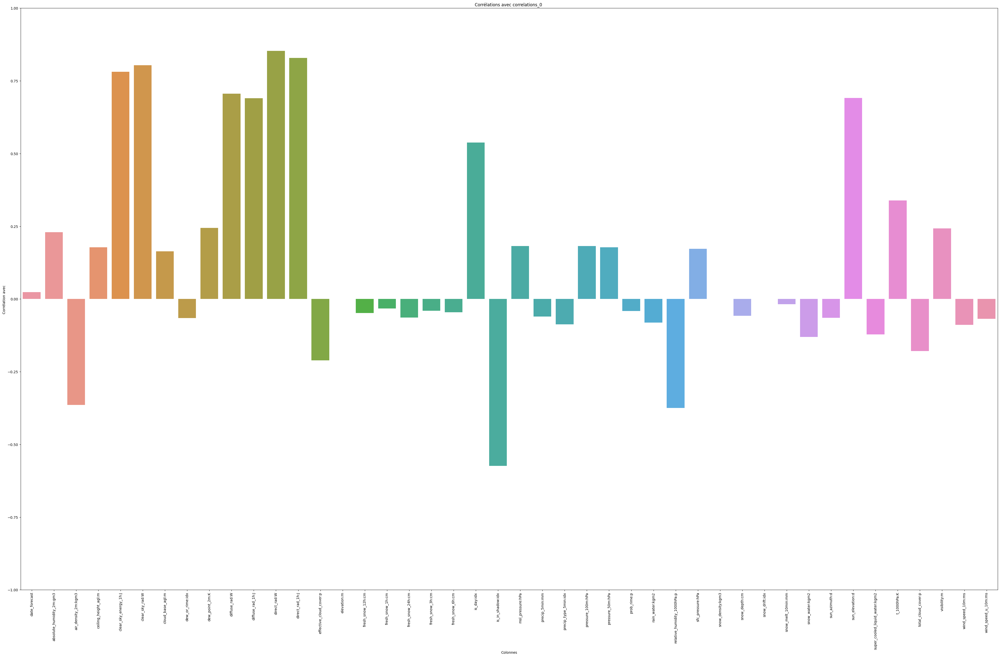

In [44]:
# Create a bar graph to visualize correlations
plt.figure(figsize=(50, 30))
sns.barplot(x=correlations_0.index[:-3], y=correlations_0.values[:-3])
plt.xlabel("Colonnes")
plt.ylabel(f"Corrélation avec ")
plt.title(f"Corrélations avec "+"correlations_0 ")
plt.xticks(rotation=90)
plt.ylim(-1,1)
plt.show()

## A rajouter

*   Search domain knowledge
*   Check if the data is intuitive
*   Understand how the data was generated
*   Explore individual features
*   Explore pairs and groups of features
*   Clean up features

## Separation of train and test set

V1: separation with a fixed date

**For this first separation, the aim is to create conditions similar to those obtained during the kaggle submission. Thus, the data must come after the training data. Deplsu, they must be estimated.**

**For our model to work, they need to have also analyzed estimated data.**

**We therefore chose to cut the estimated data set in two, putting the first part with observed in the training data, while the second will be the test set.**

In [45]:
split_date_a = pd.to_datetime("2023-02-01")

In [46]:
pv_train_a = X_total_a_y_nan[X_total_a_y_nan['date_forecast'] <= split_date_a].copy()
pv_test_a = X_total_a_y_nan[X_total_a_y_nan['date_forecast'] > split_date_a].copy()

pv_train_b = X_total_b_y_nan[X_total_b_y_nan['date_forecast'] <= split_date_a].copy()
pv_test_b = X_total_b_y_nan[X_total_b_y_nan['date_forecast'] > split_date_a].copy()

pv_train_c = X_total_c_y_nan[X_total_c_y_nan['date_forecast'] <= split_date_a].copy()
pv_test_c = X_total_c_y_nan[X_total_c_y_nan['date_forecast'] > split_date_a].copy()

NameError: ignored

In [ ]:
_ = pv_test_a \
    .rename(columns={'pv_measurement': 'TEST SET'}) \
    .join(pv_train_a.rename(columns={'pv_measurement': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='pv_measurement', style='')

_ = pv_test_b \
    .rename(columns={'pv_measurement': 'TEST SET'}) \
    .join(pv_train_b.rename(columns={'pv_measurement': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='pv_measurement', style='')

_ = pv_test_c \
    .rename(columns={'pv_measurement': 'TEST SET'}) \
    .join(pv_train_c.rename(columns={'pv_measurement': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='pv_measurement', style='')

## Post-processing

Here, we'll make sure we only have positive values.  **Zooming in at night on pv_measurement, we can see that there is no value below 10 (apart from 0). So, to compensate for our model's problems, we perform a post-processing step which consists in setting the mandatory value to 0 in these cases.**

In [ ]:
result = np.concatenate((np.concatenate((result_A,result_B)), result_C))

In [ ]:
negative_mask = result < 10
result[negative_mask] = 0